In [739]:
!pip install pandas
!pip install numpy
!pip install json
!pip install math
!pip install sklearn
!pip install seaborn
pip install umap-learn


  ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json


  ERROR: Could not find a version that satisfies the requirement math (from versions: none)
ERROR: No matching distribution found for math


In [522]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import MultiLabelBinarizer


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import umap
from sklearn import preprocessing 
%matplotlib inline

In [124]:
analysis_df = pd.read_csv("../data/test/all/metadata/all_audio_features.csv")
# Convert string-based col to list-based col where applicable
analysis_df["genre(s)"] = analysis_df["genre(s)"].str.split('//')
analysis_df["artist_names"] = analysis_df["artist_names"].str.split('//')


def unnest(df, col, reset_index=False):
    import pandas as pd
    col_flat = pd.DataFrame([[i, x] 
                       for i, y in df[col].apply(list).iteritems() 
                           for x in y], columns=['I', col])
    col_flat = col_flat.set_index('I')
    df = df.drop(col, 1)
    df = df.merge(col_flat, left_index=True, right_index=True)
    if reset_index:
        df = df.reset_index(drop=True)
    return df


analysis_df = unnest(analysis_df, 'genre(s)')

numerical_feats = ['danceability','energy','loudness','key','mode',
                   'speechiness','acousticness','instrumentalness',
                   'liveness','valence','tempo', 'duration_ms']

analysis_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id,analysis_url,duration_ms,time_signature,artist_ids,artist_names,name,genre(s)
0,0.529,0.722,1,-4.815,0,0.0814,0.213000,0.000000,0.1020,0.666,79.951,14xRAc1zbSZZzKaYgkwqdY,https://api.spotify.com/v1/audio-analysis/14xR...,212132,4,3cjEqqelV9zb4BYE3qDQ4O,[EXO],PLAYBOY,kpop
1,0.533,0.838,0,-3.722,1,0.0319,0.103000,0.000000,0.3940,0.451,75.013,7rLvsAO1yb7ElxPhkz60qh,https://api.spotify.com/v1/audio-analysis/7rLv...,196549,4,0UEP2XBR9aC5NBKcAKnBIq//4ufh0WuMZh6y4Dmdnklvdl...,"[CHEN, BAEKHYUN, XIUMIN]",For You,kpop
2,0.749,0.850,0,-4.346,1,0.0468,0.031900,0.000048,0.0678,0.672,145.983,5EzitieoPnjyKHAq0gfRMa,https://api.spotify.com/v1/audio-analysis/5Ezi...,190423,4,3cjEqqelV9zb4BYE3qDQ4O,[EXO],Ko Ko Bop,kpop
3,0.619,0.462,4,-9.154,1,0.0402,0.854000,0.000004,0.0932,0.131,123.945,1RMUSljuiZKUNaf6xskK9n,https://api.spotify.com/v1/audio-analysis/1RMU...,193931,4,4ufh0WuMZh6y4Dmdnklvdl,[BAEKHYUN],My Love,kpop
4,0.629,0.575,6,-5.763,0,0.0354,0.235000,0.000000,0.0935,0.239,136.053,5pesNiBKAx8JNwK2mQ2HEc,https://api.spotify.com/v1/audio-analysis/5pes...,218090,4,3cjEqqelV9zb4BYE3qDQ4O,[EXO],지나갈 테니 Been Through,kpop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23893,0.757,0.976,7,-4.610,0,0.0974,0.007500,0.169000,0.0394,0.922,123.015,0TR69tw5aybYHbSC1w4xy5,https://api.spotify.com/v1/audio-analysis/0TR6...,179461,4,5fMUXHkw8R8eOP2RNVYEZX//7zm3aSdmGiOkTt0aZFSO8R,"[Diplo, Wax Motif]",Love To The World,edm_dance
23894,0.670,0.970,11,-5.240,0,0.0569,0.001730,0.000065,0.1310,0.687,124.989,0PWd4sByvfGrVfADPEJAIs,https://api.spotify.com/v1/audio-analysis/0PWd...,215520,4,2E1NFr5AeEGUJkLUUsWCAO//51ElR96M6ruMMALjuOK6nH,"[OFFAIAH, BACATME]",Love Me - BACATME Remix,edm_dance
23895,0.862,0.897,2,-5.444,1,0.0365,0.066400,0.005480,0.2630,0.603,123.999,4YzJxZBPeudi2QsJiVLVCa,https://api.spotify.com/v1/audio-analysis/4YzJ...,210879,4,6M2wZ9GZgrQXHCFfjv46we//205i7E8fNVfojowcQSfK9m,"[Dua Lipa, Dom Dolla]",Don't Start Now - Dom Dolla Remix,edm_dance
23896,0.779,0.640,7,-8.415,1,0.1590,0.000155,0.000770,0.1010,0.498,99.019,4TsmezEQVSZNNPv5RJ65Ov,https://api.spotify.com/v1/audio-analysis/4Tsm...,246960,4,5pKCCKE2ajJHZ9KAiaK11H,[Rihanna],Pon de Replay,edm_dance


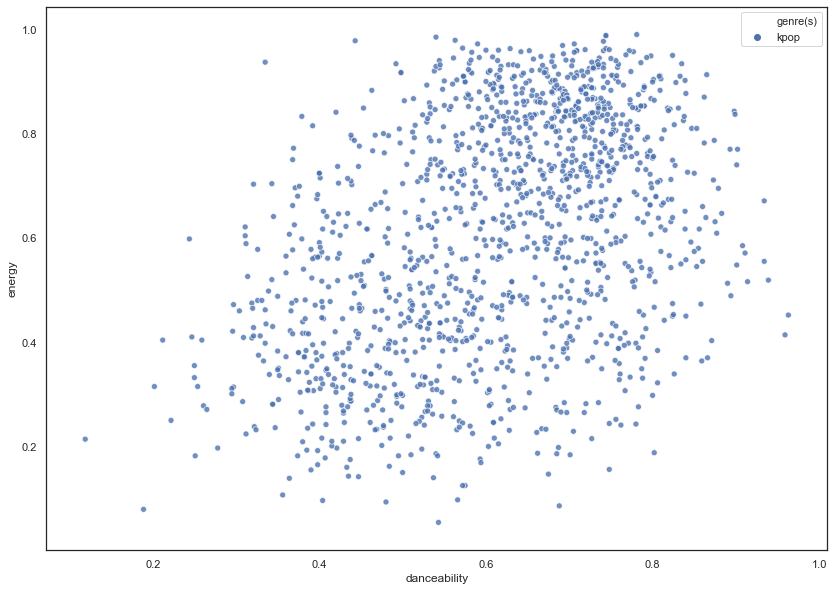

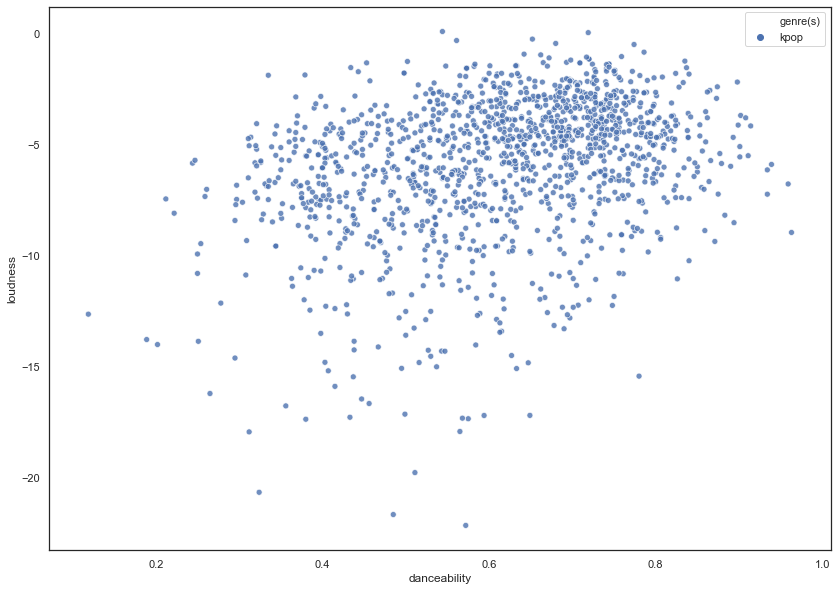

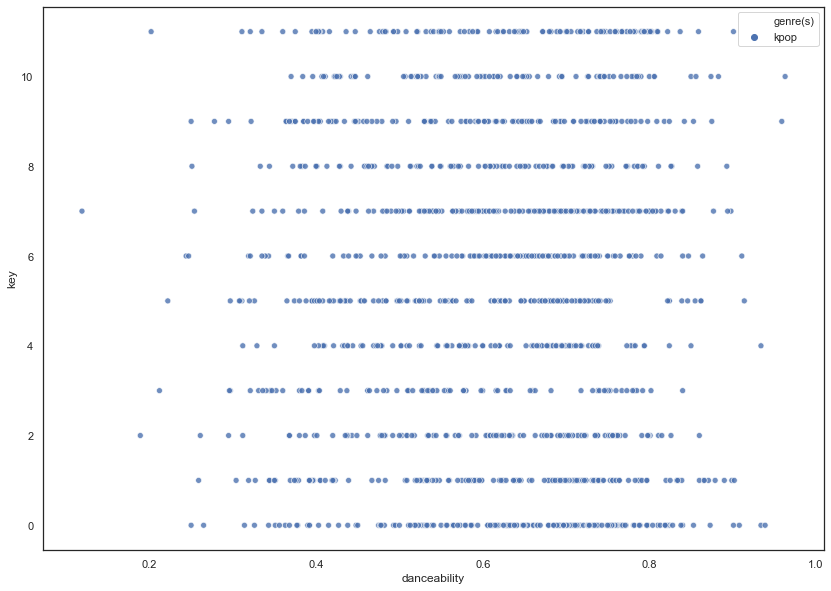

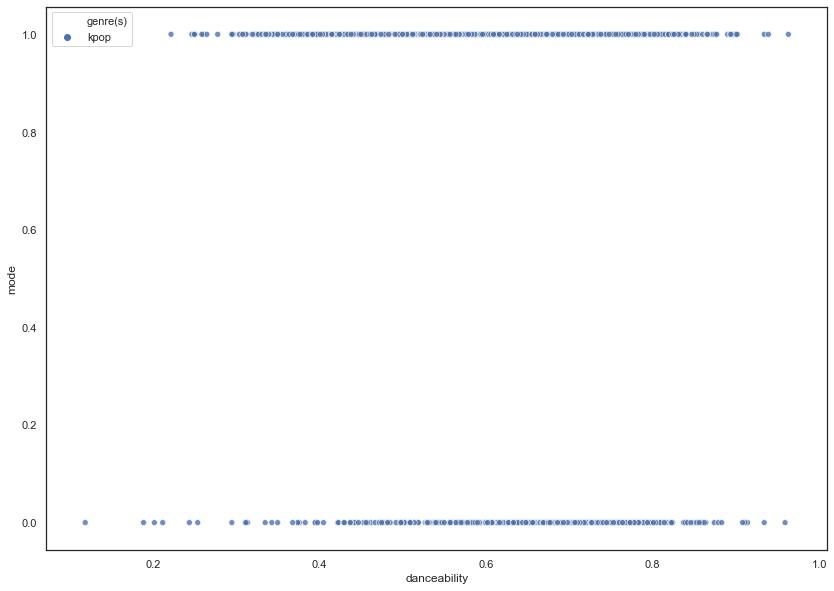

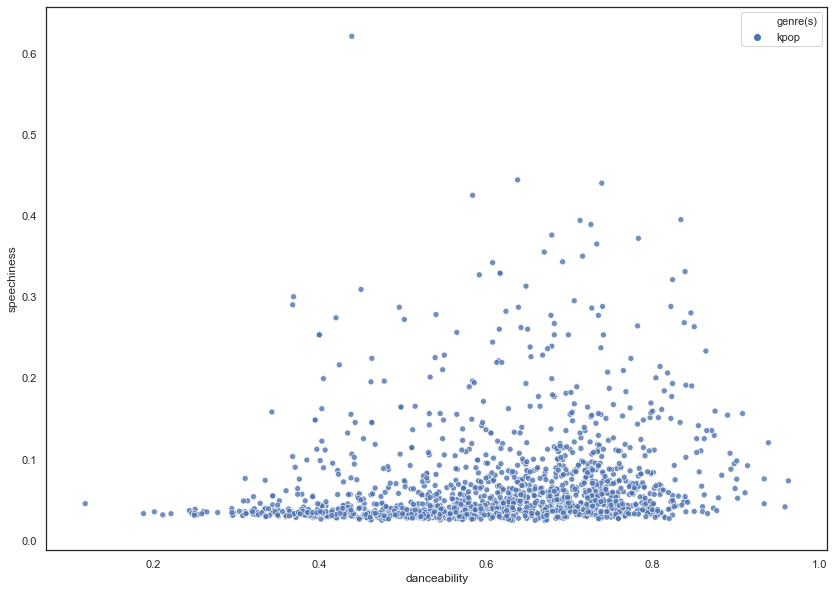

...

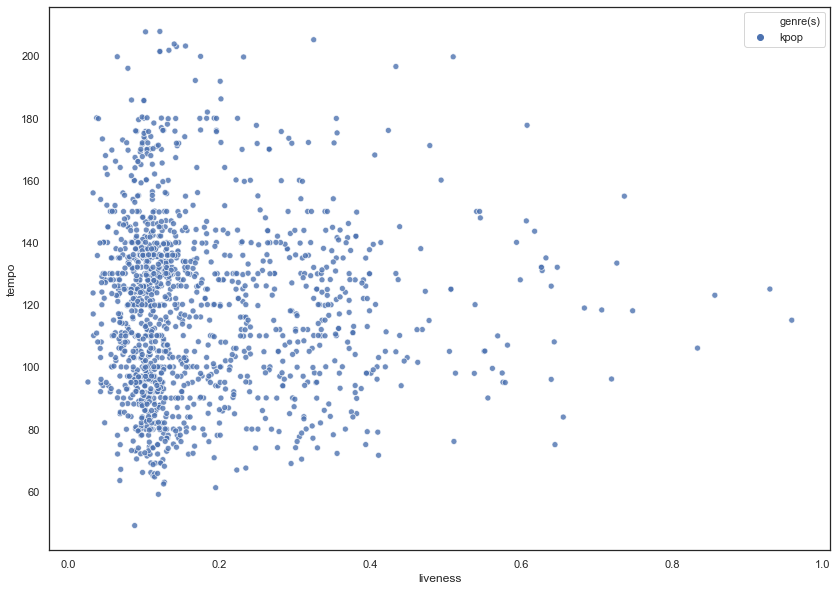

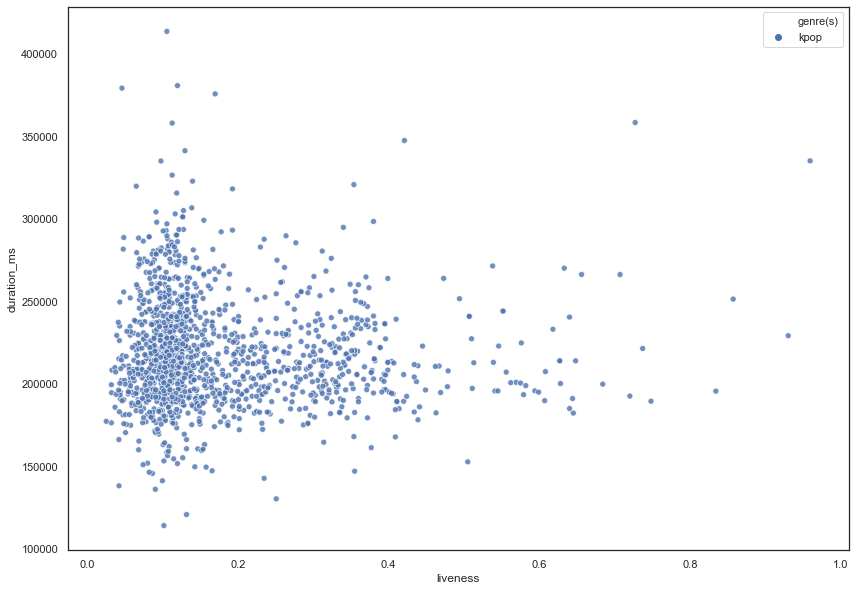

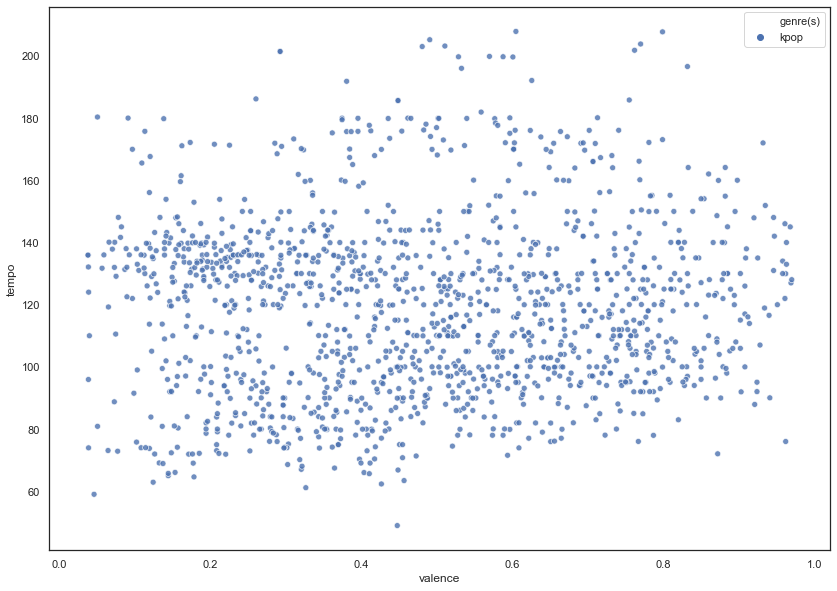

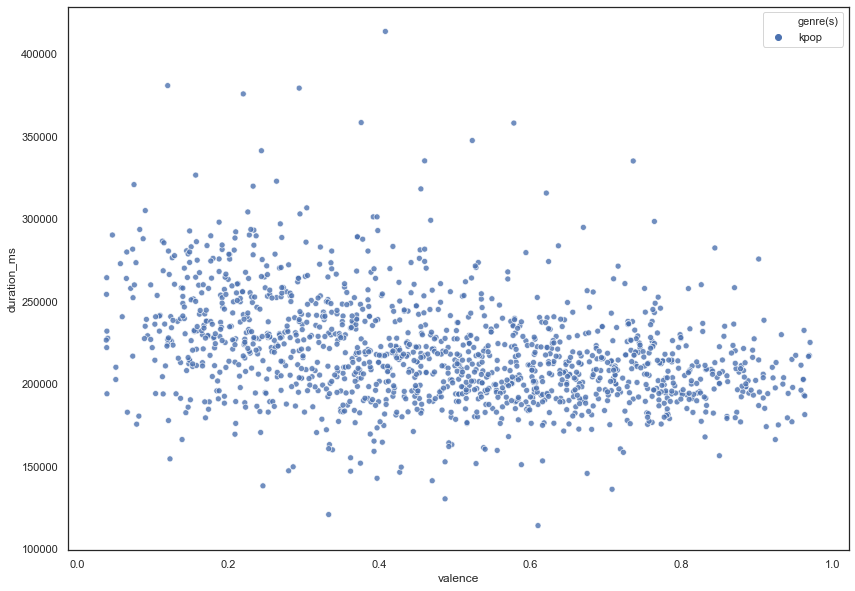

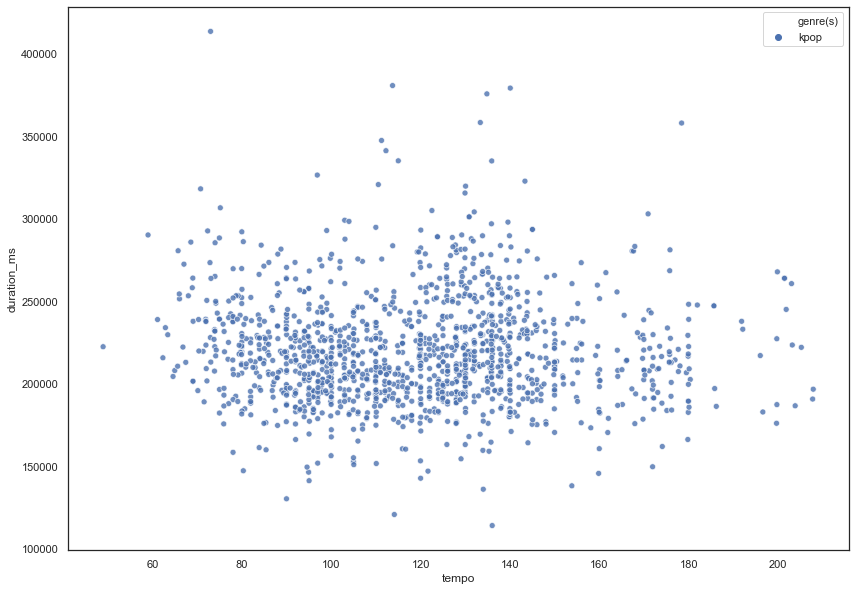

In [129]:
kpop = analysis_df[analysis_df['genre(s)'] == 'kpop']
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})
list_of_pairs = [(numerical_feats[f1], numerical_feats[f2]) for f1 in range(len(numerical_feats)) for f2 in range(f1+1,len(numerical_feats))]
for i in list_of_pairs:
    #analysis_df.plot.scatter(x=i[0], y=i[1], title=i[0] + ' vs ' + i[1],  hue='genre')
    sns.scatterplot(x=i[0], y=i[1], hue='genre(s)', data=kpop, alpha=0.8) 
    plt.show()

In [216]:
analysis_df_sample = analysis_df.sample(frac=0.25, replace=False, random_state=1)

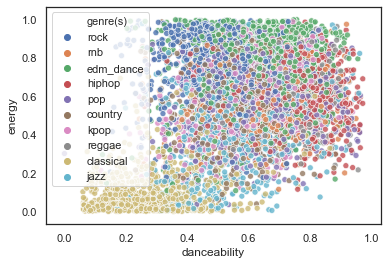

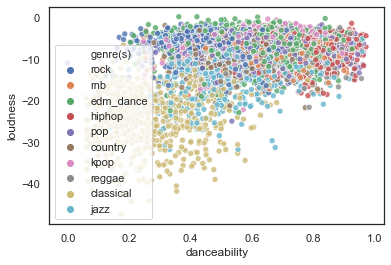

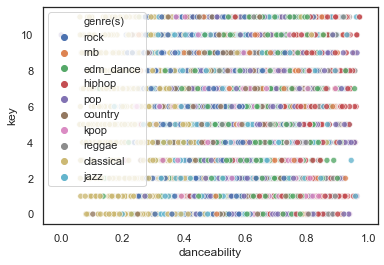

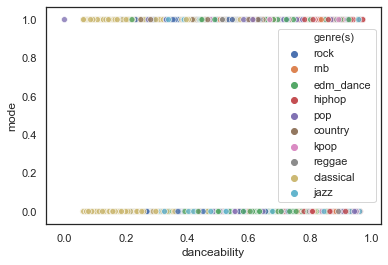

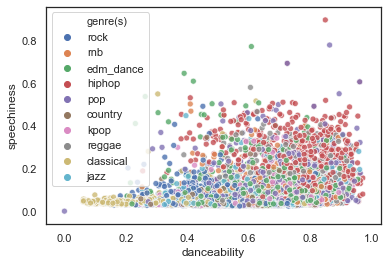

...

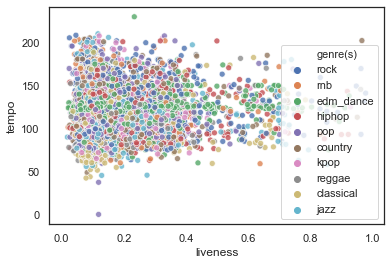

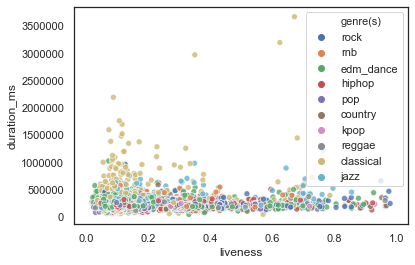

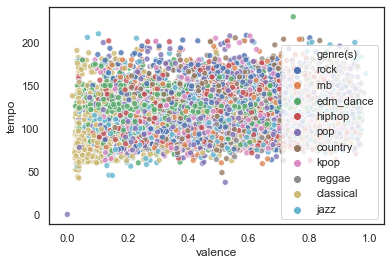

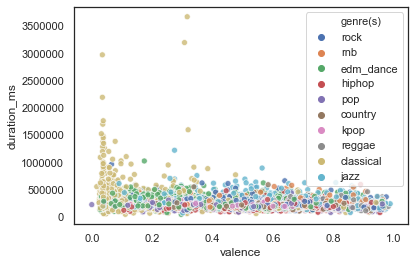

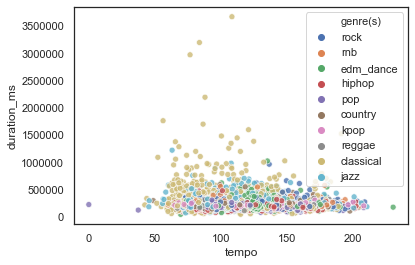

In [217]:
#scatter plots
import seaborn as sns

list_of_pairs = [(numerical_feats[f1], numerical_feats[f2]) for f1 in range(len(numerical_feats)) for f2 in range(f1+1,len(numerical_feats))]
for i in list_of_pairs:
    #analysis_df.plot.scatter(x=i[0], y=i[1], title=i[0] + ' vs ' + i[1],  hue='genre')
    sns.scatterplot(x=i[0], y=i[1], hue='genre(s)', data=analysis_df_sample, alpha=0.8) 
    plt.show()


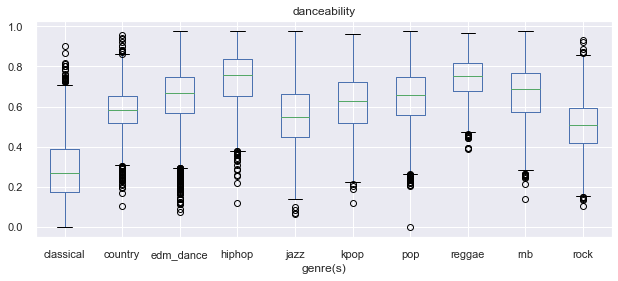

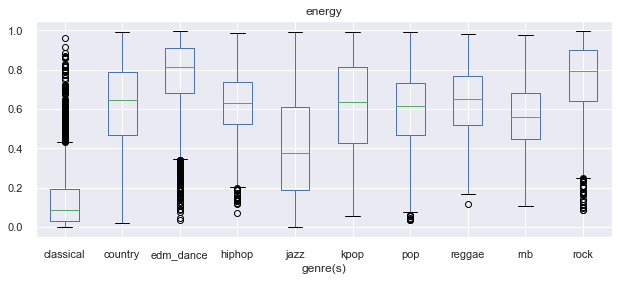

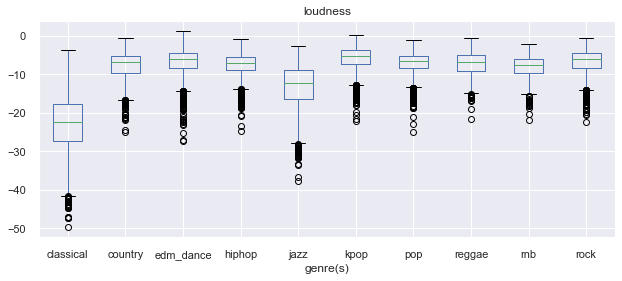

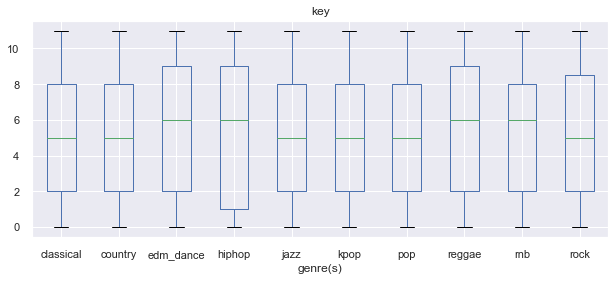

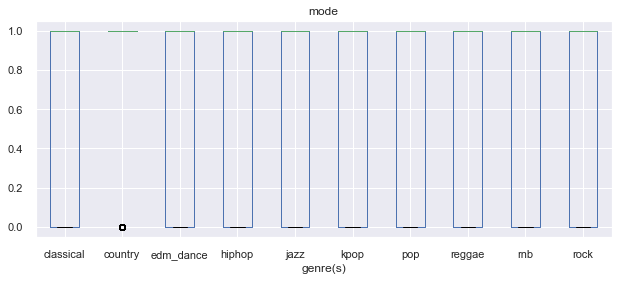

...

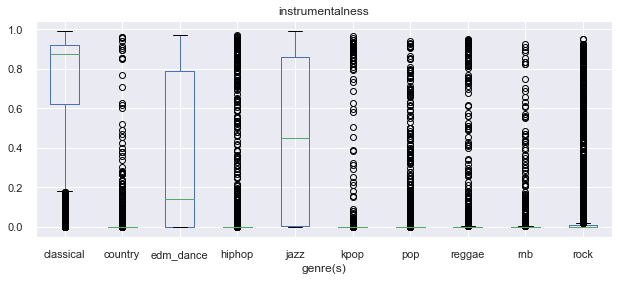

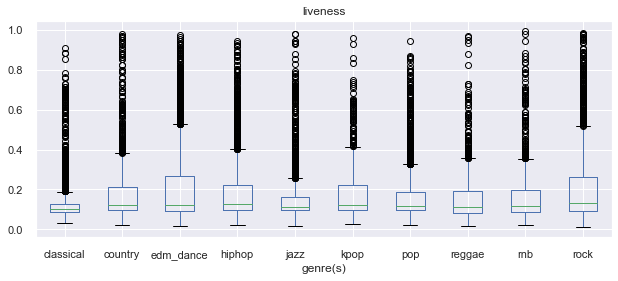

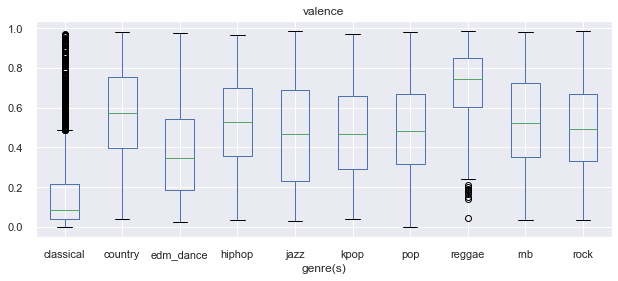

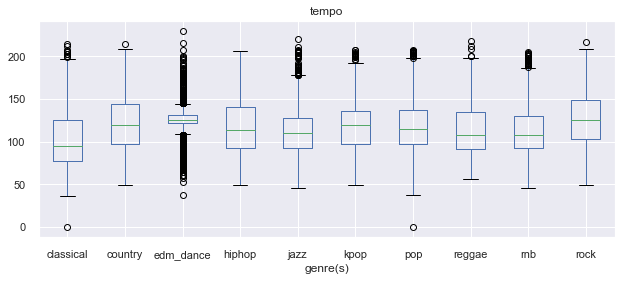

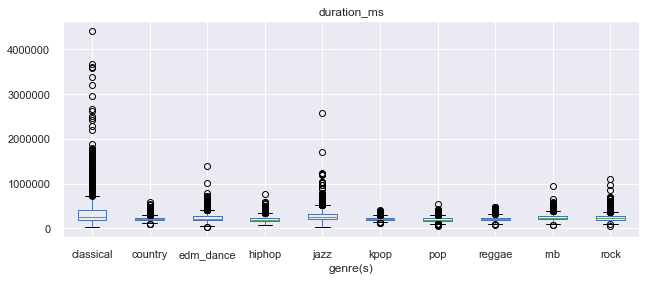

In [560]:
for i in numerical_feats:
    fig, ax = plt.subplots(figsize=(10,4))
    plt.suptitle('')
    analysis_df.boxplot(column=[i], by='genre(s)', ax=ax).get_figure().suptitle('')

In [629]:
print(umap.__version__)
numerical_feats

0.3.10


['danceability',
 'energy',
 'loudness',
 'key',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms']

In [717]:
test = ['danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence']

In [718]:
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import umap
from sklearn import preprocessing 
%matplotlib inline

In [719]:
# seaborn for plotting, we can also use bokeh
sns.set(style='darkgrid', context='notebook', rc={'figure.figsize':(14,10)})

In [720]:
num_df = analysis_df_sample[test]
num_df['genre(s)'] = analysis_df_sample['genre(s)']
le = preprocessing.LabelEncoder()
num_df['genre(s)'] = le.fit_transform(num_df['genre(s)'].values)
mapping = dict(zip(le.classes_, range(len(le.classes_))))
num_df

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,genre(s)
7123,0.658,0.814,-4.631,0.0558,0.229000,0.006760,0.2160,0.6900,9
13305,0.726,0.408,-6.606,0.0614,0.603000,0.000000,0.2250,0.4590,8
22977,0.786,0.859,-8.637,0.0751,0.003640,0.770000,0.1060,0.6410,2
9647,0.964,0.595,-8.290,0.1300,0.000895,0.000000,0.0955,0.2690,3
3237,0.836,0.684,-5.818,0.2410,0.122000,0.000000,0.0854,0.5140,6
...,...,...,...,...,...,...,...,...,...
20910,0.681,0.886,-8.745,0.0339,0.227000,0.780000,0.0617,0.0780,2
19983,0.436,0.163,-18.953,0.0338,0.900000,0.906000,0.1070,0.0926,2
1743,0.556,0.649,-5.807,0.0781,0.163000,0.214000,0.1090,0.1190,6
280,0.669,0.684,-4.595,0.0585,0.252000,0.000000,0.7200,0.4660,5


In [721]:
mapping

{'classical': 0,
 'country': 1,
 'edm_dance': 2,
 'hiphop': 3,
 'jazz': 4,
 'kpop': 5,
 'pop': 6,
 'reggae': 7,
 'rnb': 8,
 'rock': 9}

In [722]:
genre_json = {
    'data' : num_df[test].values, 
    'target' : num_df['genre(s)'].values
}
genre_json

{'data': array([[ 6.580e-01,  8.140e-01, -4.631e+00, ...,  6.760e-03,  2.160e-01,
          6.900e-01],
        [ 7.260e-01,  4.080e-01, -6.606e+00, ...,  0.000e+00,  2.250e-01,
          4.590e-01],
        [ 7.860e-01,  8.590e-01, -8.637e+00, ...,  7.700e-01,  1.060e-01,
          6.410e-01],
        ...,
        [ 5.560e-01,  6.490e-01, -5.807e+00, ...,  2.140e-01,  1.090e-01,
          1.190e-01],
        [ 6.690e-01,  6.840e-01, -4.595e+00, ...,  0.000e+00,  7.200e-01,
          4.660e-01],
        [ 6.140e-01,  3.790e-01, -1.048e+01, ...,  4.640e-04,  9.860e-02,
          2.010e-01]]), 'target': array([9, 8, 2, ..., 6, 5, 6])}

In [726]:
reducer = umap.UMAP(
    n_neighbors=31,
    min_dist=0.0,
    n_components=2,
    random_state=42,
)

In [727]:
embedding = reducer.fit_transform(genre_json['data'])
embedding.shape


(6256, 2)

{'classical': 0, 'country': 1, 'edm_dance': 2, 'hiphop': 3, 'jazz': 4, 'kpop': 5, 'pop': 6, 'reggae': 7, 'rnb': 8, 'rock': 9}


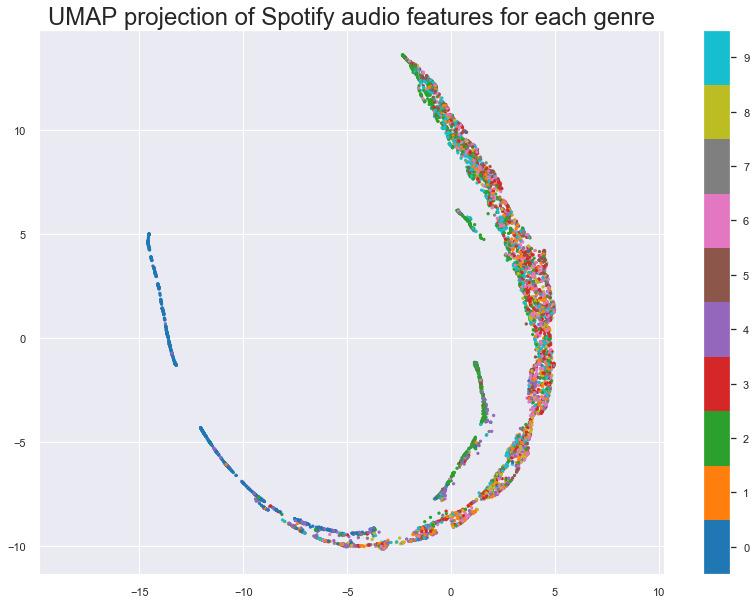

In [728]:
plt.scatter(embedding[:, 0], embedding[:, 1], c=genre_json['target'], cmap='tab10', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries = np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of Spotify audio features for each genre', fontsize=24);
print(mapping)

In [732]:
num_df = analysis_df_sample[test]
num_df['genre(s)'] = analysis_df_sample['genre(s)']
num_df

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,genre(s)
7123,0.658,0.814,-4.631,0.0558,0.229000,0.006760,0.2160,0.6900,rock
13305,0.726,0.408,-6.606,0.0614,0.603000,0.000000,0.2250,0.4590,rnb
22977,0.786,0.859,-8.637,0.0751,0.003640,0.770000,0.1060,0.6410,edm_dance
9647,0.964,0.595,-8.290,0.1300,0.000895,0.000000,0.0955,0.2690,hiphop
3237,0.836,0.684,-5.818,0.2410,0.122000,0.000000,0.0854,0.5140,pop
...,...,...,...,...,...,...,...,...,...
20910,0.681,0.886,-8.745,0.0339,0.227000,0.780000,0.0617,0.0780,edm_dance
19983,0.436,0.163,-18.953,0.0338,0.900000,0.906000,0.1070,0.0926,edm_dance
1743,0.556,0.649,-5.807,0.0781,0.163000,0.214000,0.1090,0.1190,pop
280,0.669,0.684,-4.595,0.0585,0.252000,0.000000,0.7200,0.4660,kpop


In [733]:
num_df_binary = num_df
num_df_binary.loc[num_df_binary['genre(s)'] == 'kpop', 'genre(s)'] = 1
num_df_binary.loc[num_df_binary['genre(s)'] != 1, 'genre(s)'] = 0
num_df_binary['genre(s)'].unique()

array([0, 1], dtype=int64)

In [734]:
genre_json_binary = {
    'data' : num_df_binary[test].values, 
    'target' : num_df_binary['genre(s)'].values
}
genre_json_binary

{'data': array([[ 6.580e-01,  8.140e-01, -4.631e+00, ...,  6.760e-03,  2.160e-01,
          6.900e-01],
        [ 7.260e-01,  4.080e-01, -6.606e+00, ...,  0.000e+00,  2.250e-01,
          4.590e-01],
        [ 7.860e-01,  8.590e-01, -8.637e+00, ...,  7.700e-01,  1.060e-01,
          6.410e-01],
        ...,
        [ 5.560e-01,  6.490e-01, -5.807e+00, ...,  2.140e-01,  1.090e-01,
          1.190e-01],
        [ 6.690e-01,  6.840e-01, -4.595e+00, ...,  0.000e+00,  7.200e-01,
          4.660e-01],
        [ 6.140e-01,  3.790e-01, -1.048e+01, ...,  4.640e-04,  9.860e-02,
          2.010e-01]]), 'target': array([0, 0, 0, ..., 0, 1, 0], dtype=int64)}

In [735]:
reducer = umap.UMAP(
    n_neighbors=31,
    min_dist=0.0,
    n_components=2,
    random_state=42,
)

In [736]:
embedding = reducer.fit_transform(genre_json_binary['data'])
embedding.shape

(6256, 2)

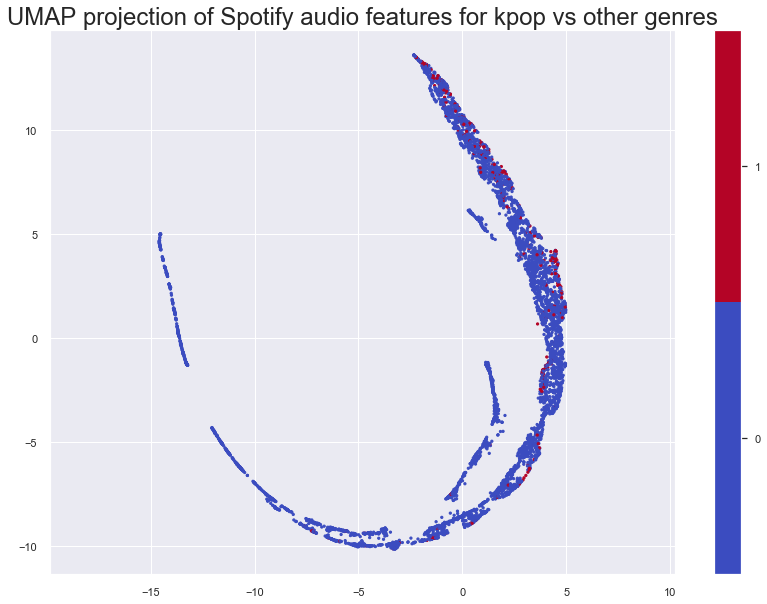

In [737]:
plt.scatter(embedding[:, 0], embedding[:, 1], c=genre_json_binary['target'], cmap='coolwarm', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries = np.arange(3)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of Spotify audio features for kpop vs other genres', fontsize=24);